##### Copyright 2018 Google LLC.

Licensed under the Apache License, Version 2.0 (the "License");

In [29]:
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Install, Import

In [30]:
# Imports
%tensorflow_version 1.x
import numpy as np
import tensorflow as tf

from lucid.modelzoo import vision_models
from lucid.misc.io import show, load, save
from lucid.misc.tfutil import create_session

import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render
import pickle
from lucid.optvis.objectives import wrap_objective
from collections import OrderedDict
from os.path import basename, join
from google.colab import drive
import lucid.modelzoo.nets_factory as nets
from PIL import Image




# Mount drive

In [31]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [32]:
root_dir = '/content/drive/My Drive/ra15808/Courses/Art_of_MD'

# Globals

Any parameters that are set up front and won't change should go here. The parameters below refer to the indices the target, content and style images have within the input tensors. 

In [33]:
# these constants help remember which image is at which batch dimension
TARGET_INDEX = 0
STYLE_INDEX = 1


# Functions

In [34]:
def arr_to_img(arr):
    return Image.fromarray((arr*255).astype('uint8'))

def tile(arr, n,  max_dim):
  """
  Tiles the array to be n x n
  """
  arr = np.tile(arr, (n, n, 1))
  img = arr_to_img(arr)
  npimg = size_scale(img, (max_dim, max_dim), max_dim)
  return npimg


def size_scale(img, size, max_dim):
  """
  Resizes, crops to max_dim x max_dim, then scales so 
  pixels are in [0, 1]
  """
  img = np.asarray(img.resize(size,Image.ANTIALIAS))
  # crop from top left
  img = img[:max_dim, :max_dim, :]
  # rescale
  img_max = np.iinfo(img.dtype).max
  npimg = np.divide(img, img_max, dtype=np.float32)
  return npimg


def load_img(path_to_img, max_dim=512):
  """
  Opens image, makes sure that its shortest side
  is max_dim, then crops it to max_dim x max_dim
  The pixel values are then scaled to be in [0, 1]
  """
  # load
  img = Image.open(path_to_img)
  # resize 
  short = min(img.size)
  scale = max_dim/short
  new_size = (round(img.size[0]*scale), round(img.size[1]*scale))
  npimg = size_scale(img, new_size, max_dim)
  return npimg

def style_transfer_param(style_image, decorrelate=True, fft=True):
  style_transfer_input = param.image(*style_image.shape[:2], decorrelate=decorrelate, fft=fft)[0]
  style_input = style_image
  return tf.stack([style_transfer_input, style_input])


def mean_L1(a, b):
  return tf.reduce_mean(tf.abs(a-b))

@wrap_objective
def activation_difference(layer_names, activation_loss_f=mean_L1, transform_f=None, difference_to=STYLE_INDEX):
  def inner(T):
    # first we collect the (constant) activations of image we're computing the difference to
    image_activations = [T(layer_name)[difference_to] for layer_name in layer_names]
    if transform_f is not None:
      image_activations = [transform_f(act) for act in image_activations]
    
    # we also set get the activations of the optimized image which will change during optimization
    optimization_activations = [T(layer)[TARGET_INDEX] for layer in layer_names]
    if transform_f is not None:
      optimization_activations = [transform_f(act) for act in optimization_activations]
    
    # we use the supplied loss function to compute the actual losses
    losses = [activation_loss_f(a, b) for a, b in zip(image_activations, optimization_activations)]
    return tf.add_n(losses) 
    
  return inner

def gram_matrix(array, normalize_magnitue=True):
  channels = tf.shape(array)[-1]
  array_flat = tf.reshape(array, [-1, channels])
  gram_matrix = tf.matmul(array_flat, array_flat, transpose_a=True)
  if normalize_magnitue:
    length = tf.shape(array_flat)[0]
    gram_matrix /= tf.cast(length, tf.float32)
  return gram_matrix

# Hyper-parameters


## Vision model 

The vision model will determine the available layers so we'll define this first, load it and this will allow us to inspect the available layer names. 

The available vision models can be shown by uncommenting and running the cell below. VGG16 (`VGG16_caffe`) is a popular choice, although GoogleLeNet (`InceptionV1`) is the one we'll use here as I've used it in my project `Metastable Impressions` and found it works just as well. 

In [35]:
# list(nets.models_map.keys())

In [36]:
# The vision model to use
model_name = 'InceptionV1'
model = nets.models_map[model_name]()
model.load_graphdef()

With the vision model in the variable `model` we can inspect the available layers. Here I'm only listing the convolutional layers (they have 'conv' in the layer metadata). 

In [37]:
layers = [x.name for x in model.layers if 'conv' in x.tags]
layers

['conv2d0',
 'conv2d1',
 'conv2d2',
 'mixed3a',
 'mixed3b',
 'mixed4a',
 'mixed4b',
 'mixed4c',
 'mixed4d',
 'mixed4e',
 'mixed5a',
 'mixed5b',
 'head0_bottleneck',
 'head1_bottleneck']

## Style image and training params 

In [38]:
style_layers = layers

# Image pre-processing variables
max_dim = 512 
style_tile = 2

# path to the content and style image and the directory to output the files to
style_path = join(root_dir, 'images', 'style', "okeefe.jpg")
target_path = join(root_dir, 'images', 'fingerprints')

# training parameters
threshs = [2000]

## Load image


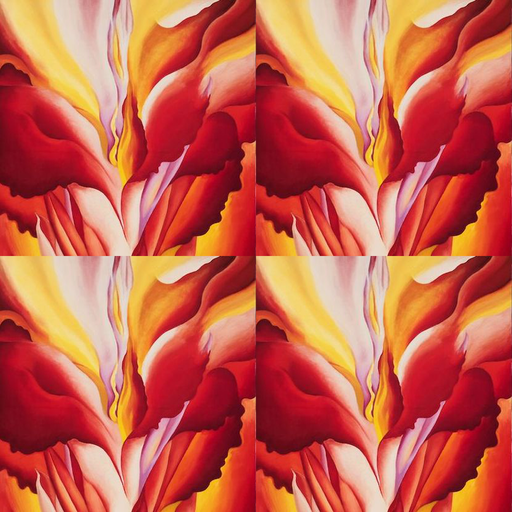

In [39]:
style_image = load_img(style_path)
style_image = tile(style_image, style_tile, max_dim)
show(style_image)

## Run fingerprint loop

Running layer:  conv2d0
2000 -239.11038



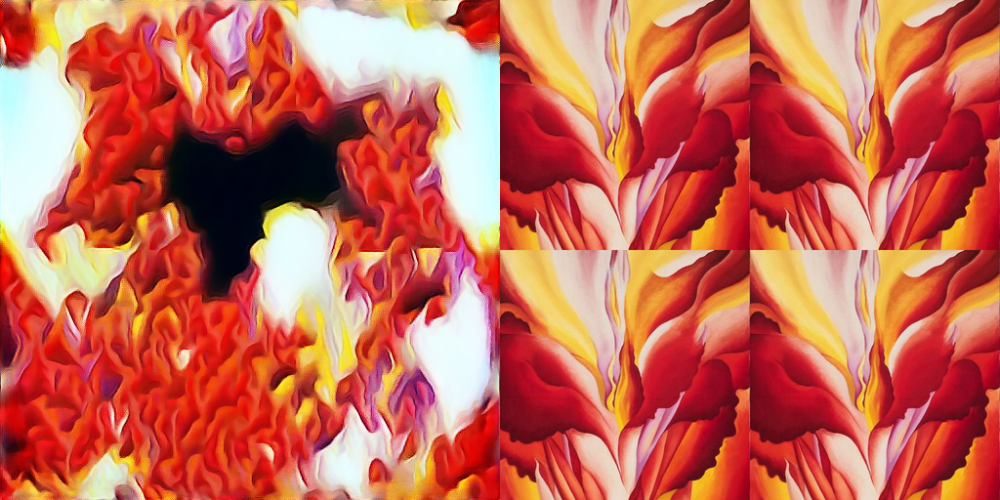

Running layer:  conv2d1
2000 -14.833



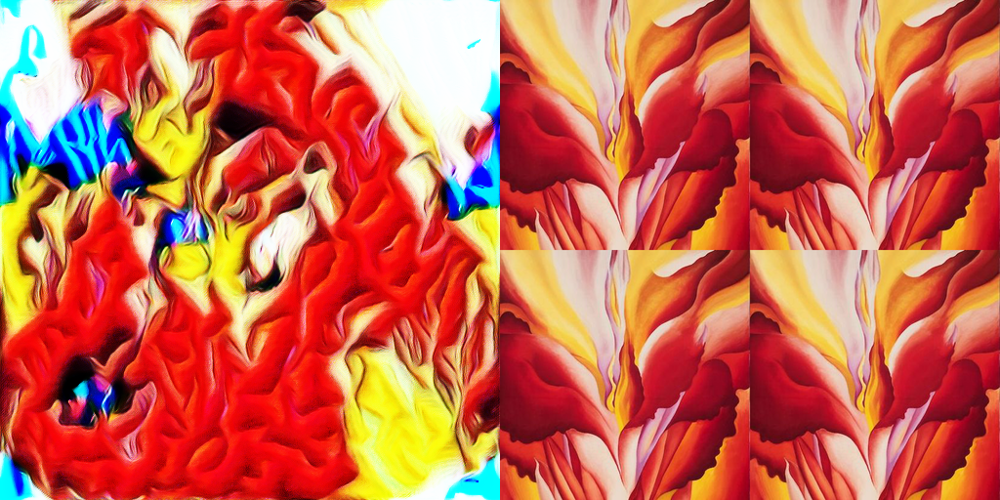

Running layer:  conv2d2
2000 -9.310828



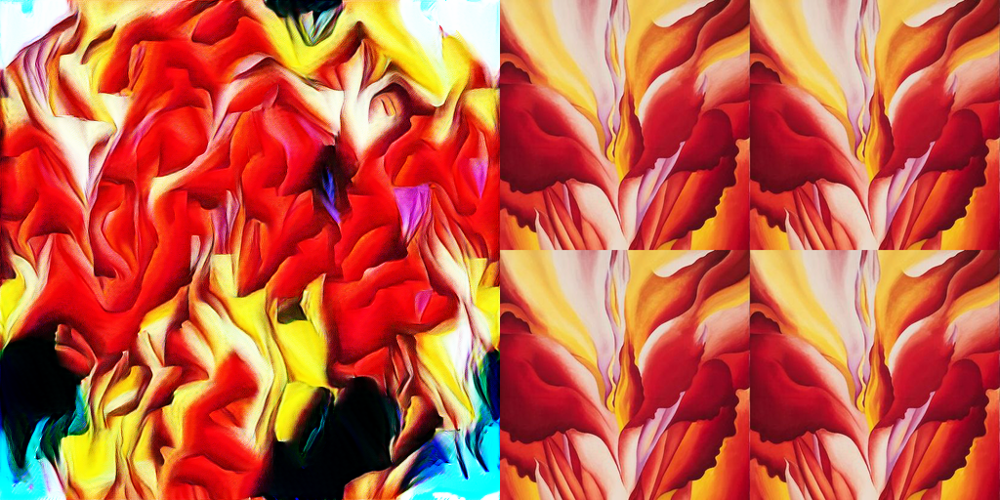

Running layer:  mixed3a
2000 -67.91535



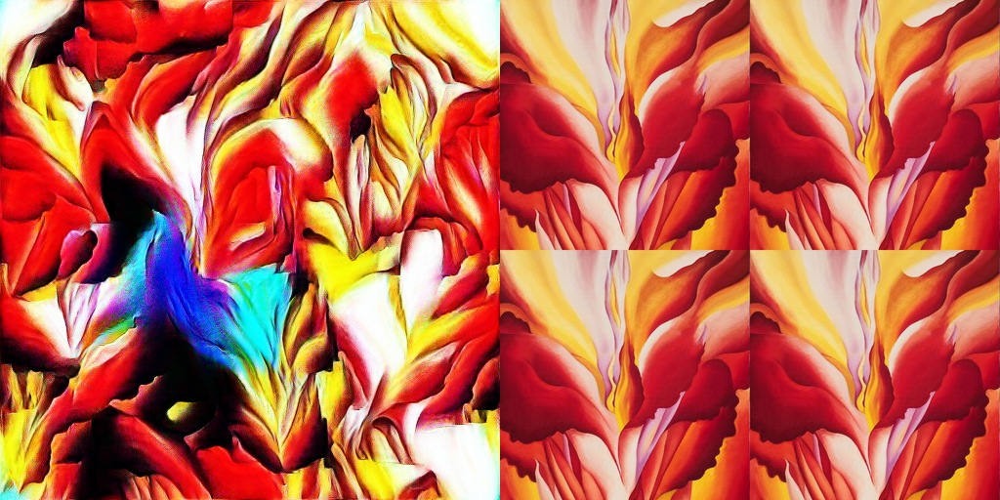

Running layer:  mixed3b
2000 -26.722452



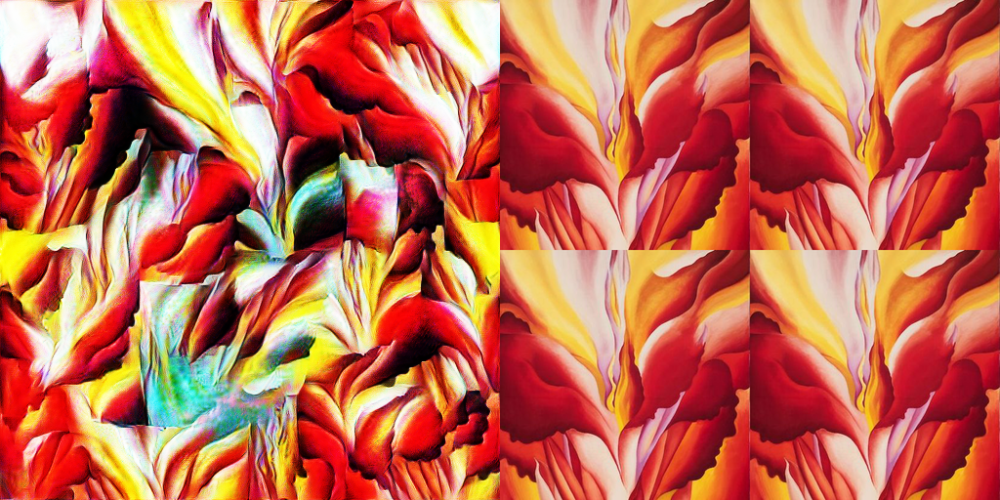

Running layer:  mixed4a
2000 -96.9256



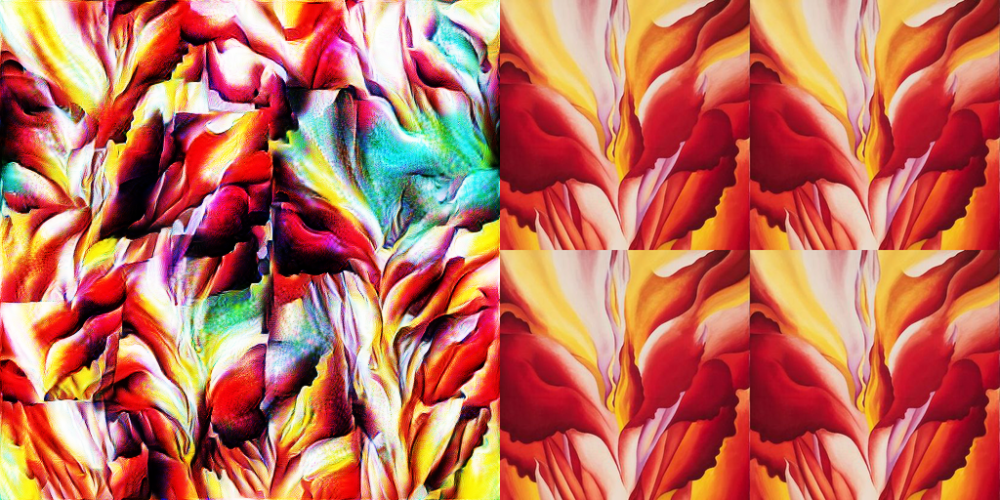

Running layer:  mixed4b
2000 -83.58461



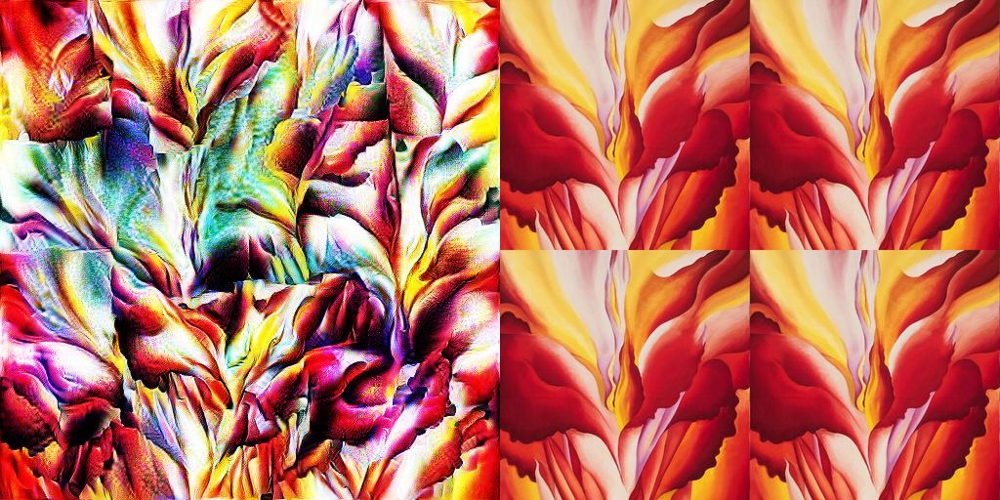

Running layer:  mixed4c
2000 -59.07798



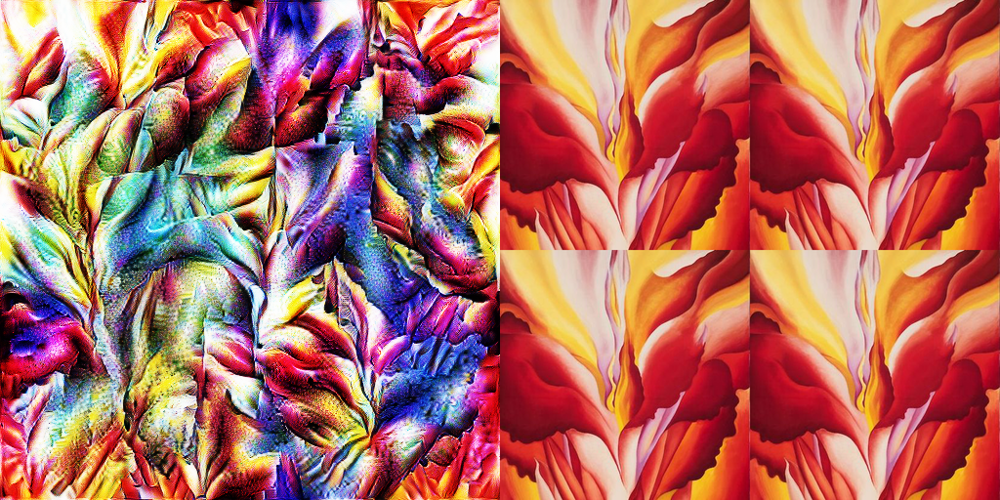

Running layer:  mixed4d
2000 -22.215332



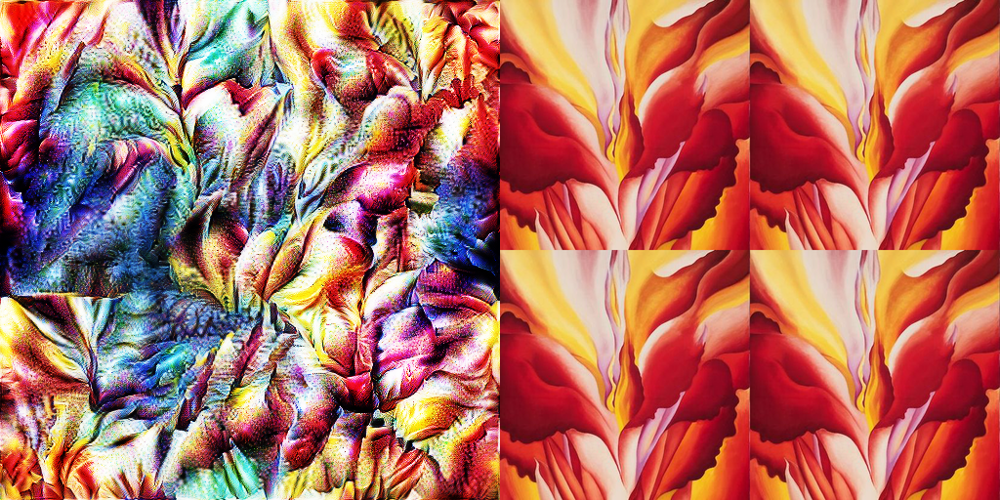

Running layer:  mixed4e
2000 -12.715003



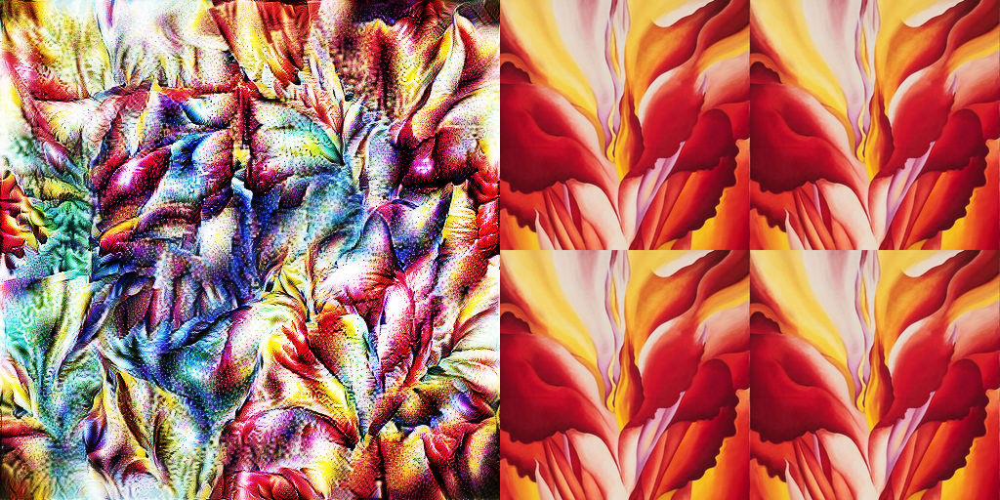

Running layer:  mixed5a
2000 -12.866722



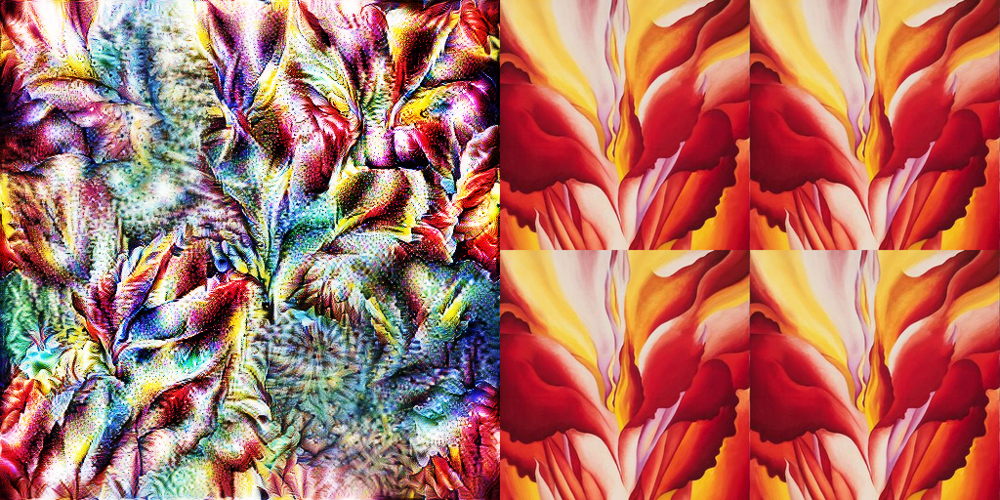

Running layer:  mixed5b
2000 -0.7375487



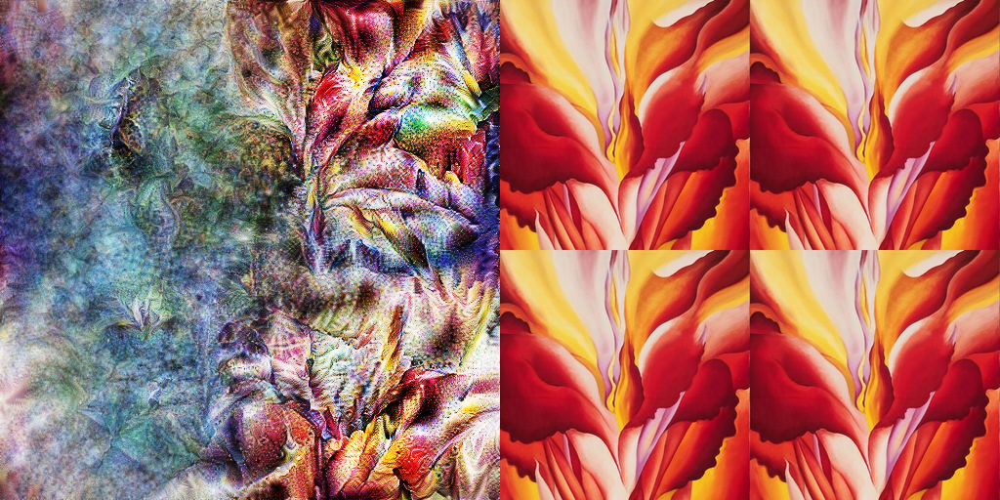

Running layer:  head0_bottleneck
2000 -3.4956903



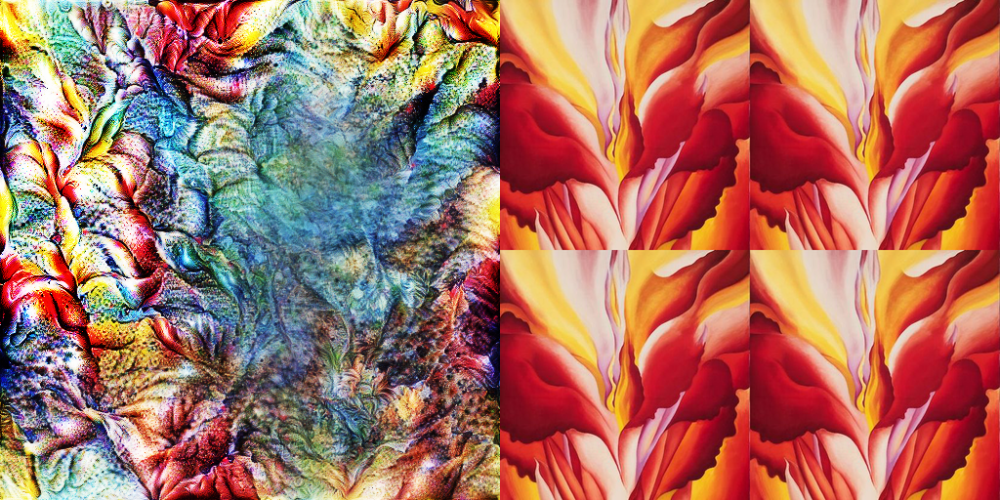

Running layer:  head1_bottleneck
2000 -2.6281738



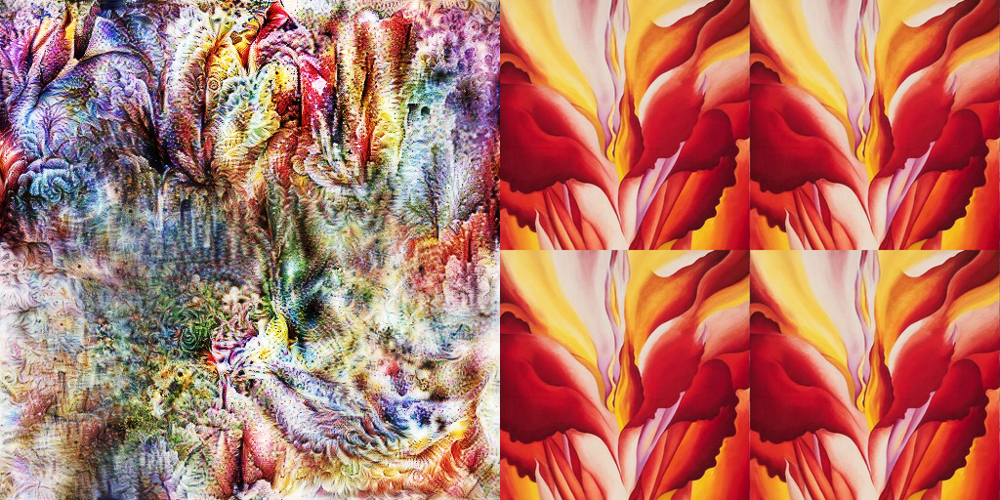

In [40]:
results = OrderedDict()

for layer in style_layers:
    print('Running layer: ', layer)
    param_f = lambda: style_transfer_param(style_image)

    style_obj = activation_difference([layer], transform_f=gram_matrix, difference_to=STYLE_INDEX)
    style_obj.description = "Style Loss"

    objective = - style_obj

    vis = render.render_vis(model, objective, param_f=param_f, thresholds=threshs, 
                            verbose=True)[-1]

    results[layer] = vis
    

## Save fingerprint

In [41]:
out_name = '{0}-{1}-fingerprint.p'.format(basename(style_path).split('.')[0], model.name)
with open(join(target_path, out_name), 'wb') as f:
    pickle.dump(results, f)